### Importing modules and mounting drive

In [0]:
import cv2
import numpy as np
from skimage import util
from skimage import img_as_ubyte
from google.colab.patches import cv2_imshow

from scipy import ndimage
from skimage import filters

print("Modules imported")

Modules imported


### Reading the input test image

Image read and stored



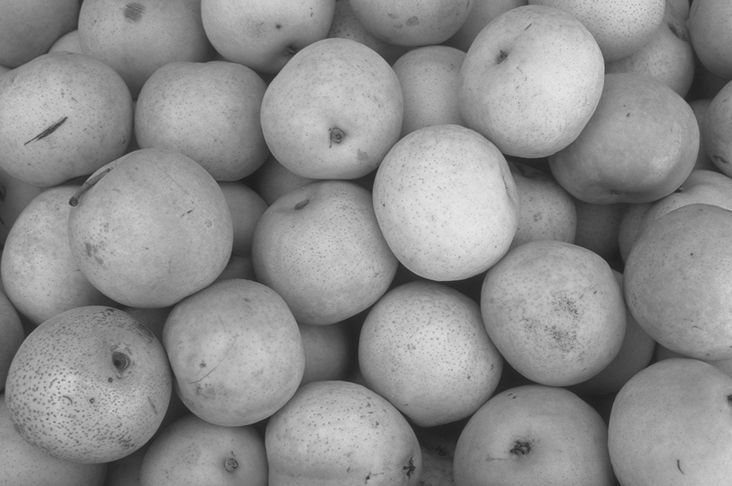

In [0]:
pears = cv2.imread("/content/drive/My Drive/Ramis/Academics/Semester 6/Digital Image Processing/Labs/Lab 9/pears.png", 0)
print("Image read and stored\n")
cv2_imshow(pears)

# Corrupting the image with different noise models


```
skimage img_as_ubyte will convert skimage float array to cv2 uint8 image
```


## Gaussian noise model

Gaussian Noise added



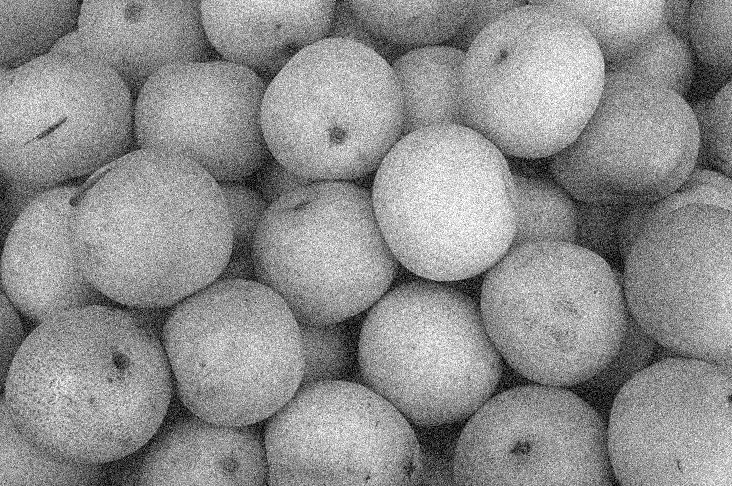

In [0]:
gaussianNoise = img_as_ubyte(util.random_noise(pears, "gaussian", clip = True))
print("Gaussian Noise added\n")
cv2_imshow(gaussianNoise)

## Poisson noise model

Poisson Noise added



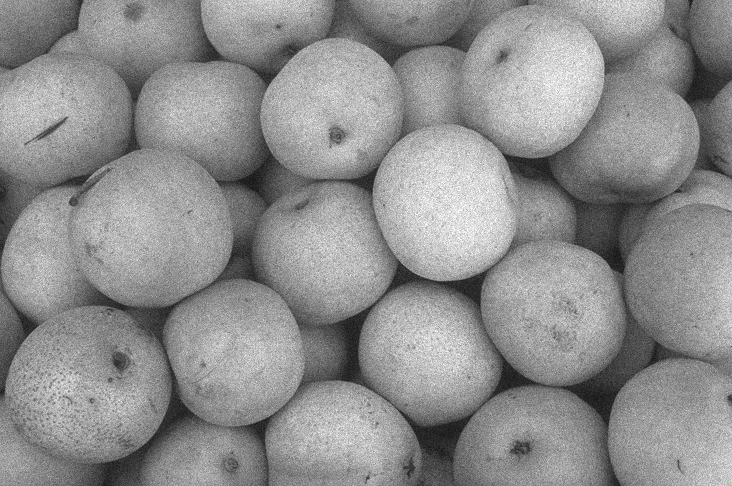

In [0]:
poissonNoise = img_as_ubyte(util.random_noise(pears, "poisson", clip = True))
print("Poisson Noise added\n")
cv2_imshow(poissonNoise)

## Speckle Noise Model (Mean = 0, variance = 0.05)

Speckle noise added



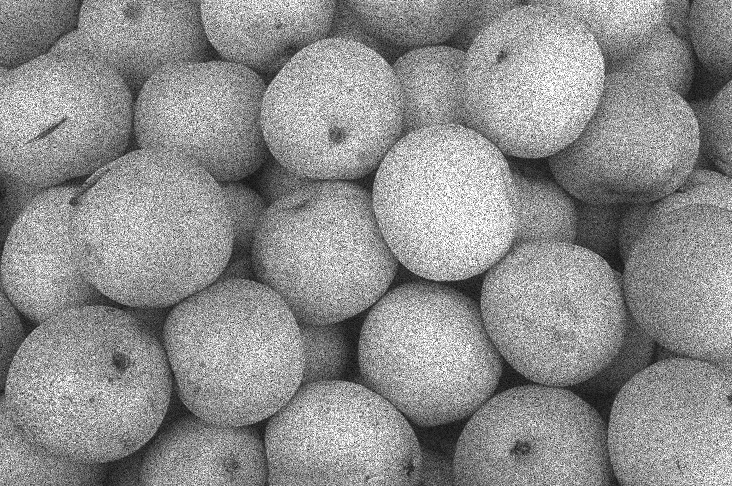

In [0]:
speckleNoise = img_as_ubyte(util.random_noise(pears, "speckle", clip = True, mean = 0, var = 0.05))
print("Speckle noise added\n")
cv2_imshow(speckleNoise)

## Salt Noise (10% of the image pixels)

Salt noise added



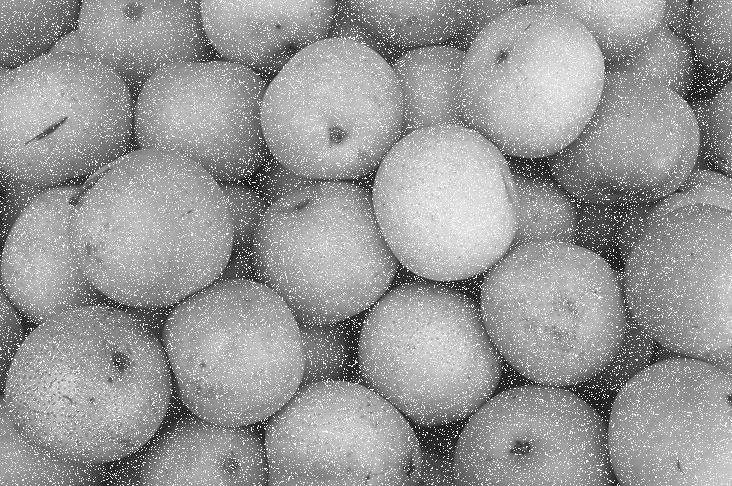

In [0]:
#util.random_noise amount = 0.1 for salt noise affecting 10% of the pixels
saltNoise = img_as_ubyte(util.random_noise(pears, "salt", clip = True, amount = 0.1))
print("Salt noise added\n")
cv2_imshow(saltNoise)

## Pepper Noise (10% of the image pixels)

Pepper noise added



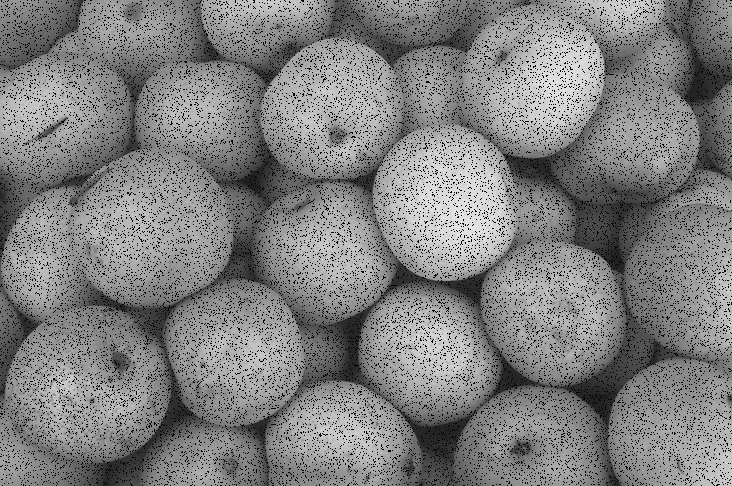

In [0]:
#util.random_noise amount = 0.1 for pepper noise affecting 10% of the pixels
pepperNoise = img_as_ubyte(util.random_noise(pears, "pepper", clip = True, amount = 0.1))
print("Pepper noise added\n")
cv2_imshow(pepperNoise)

## Salt and Pepper Noise (s:p ratio = 0.6)

Salt and Pepper Noise added



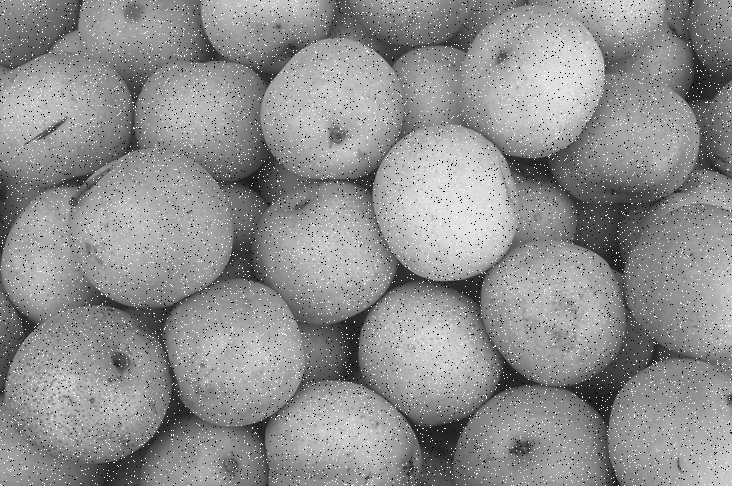

In [0]:
sandpNoise = img_as_ubyte(util.random_noise(pears, "s&p", clip = True, salt_vs_pepper = 0.6))
print("Salt and Pepper Noise added\n")
cv2_imshow(sandpNoise)

# Removing image noise with noise removal filters

In [0]:
#adding all noise added images in an array
noiseImages = [gaussianNoise, poissonNoise, speckleNoise, saltNoise, pepperNoise, sandpNoise]
noise = ["Gaussian", "Poisson", "Speckle", "Salt", "Pepper", "Salt and Pepper"]

## Arithmetic mean filter

Arithmetic mean filter to remove noise


 Gaussian Noise filtered



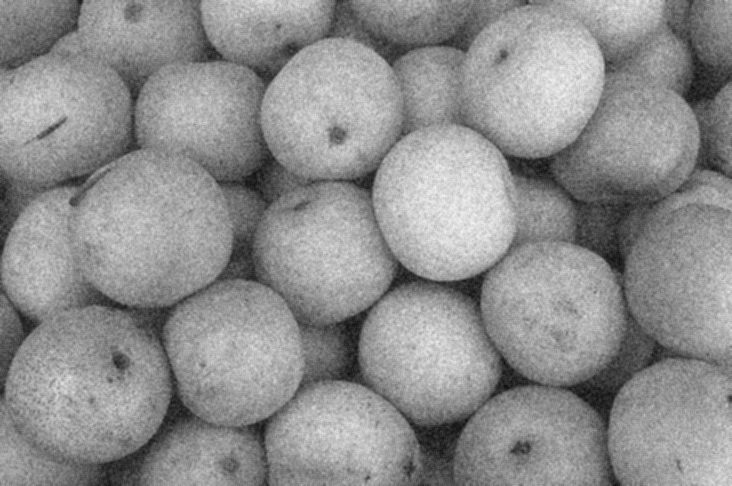



 Poisson Noise filtered



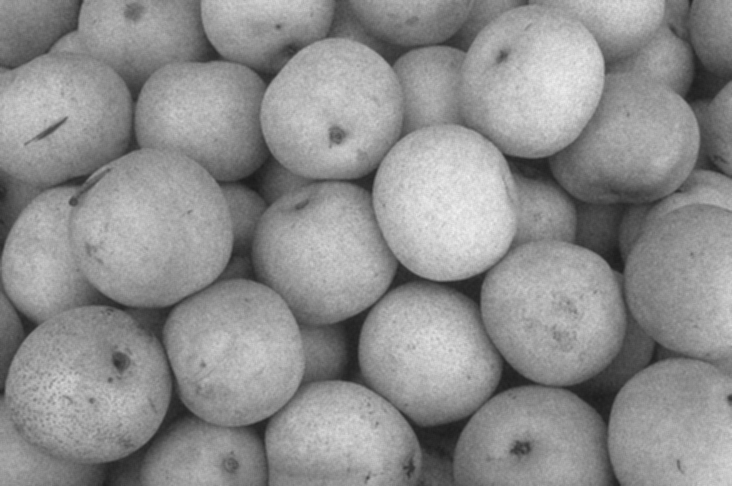



 Speckle Noise filtered



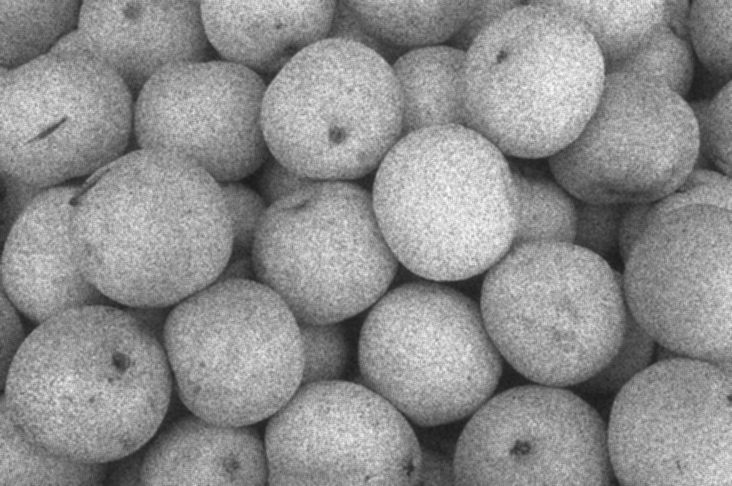



 Salt Noise filtered



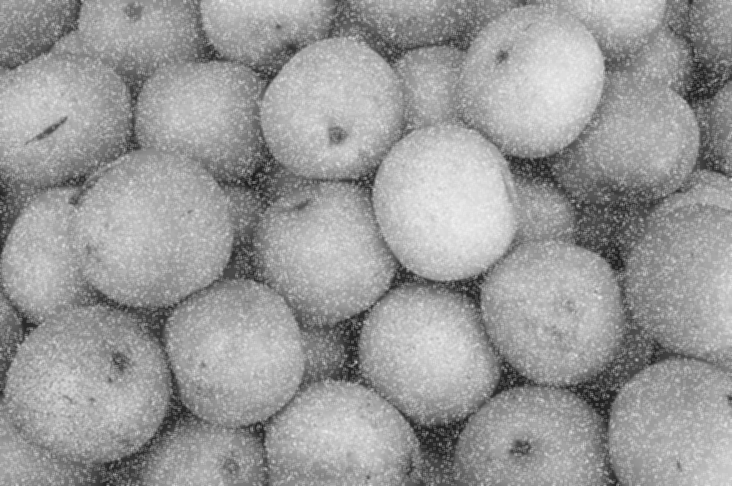



 Pepper Noise filtered



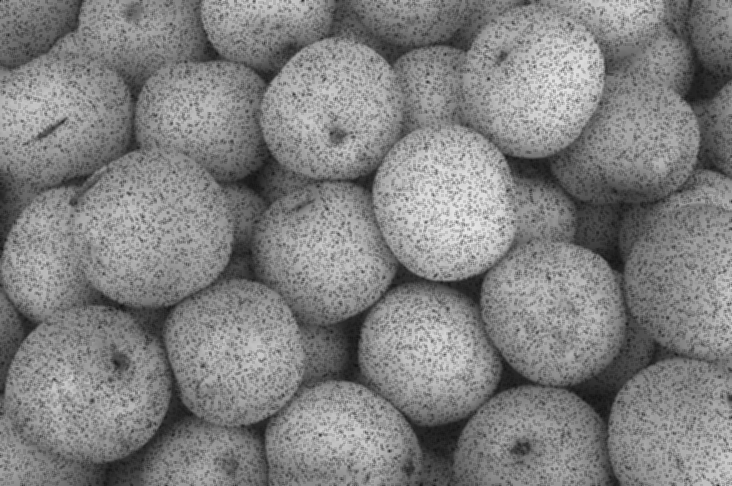



 Salt and Pepper Noise filtered



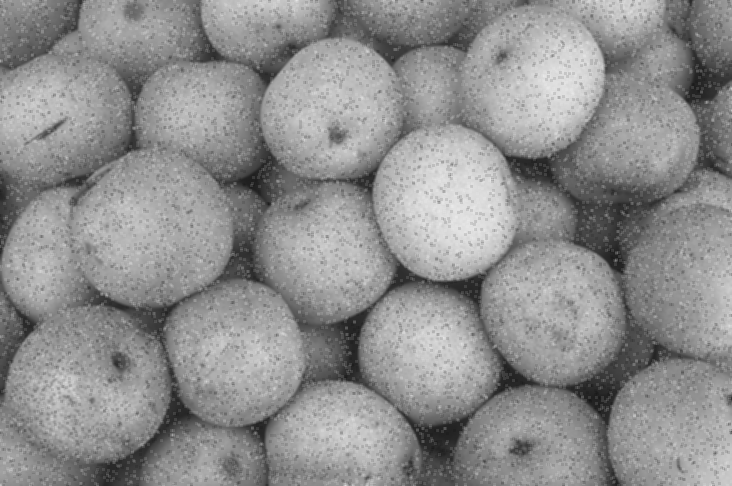

In [0]:
#kernel for arithmetic noise filter
arithmeticKernel = np.array([[1,1,1],[1,1,1],[1,1,1]]).reshape(3,3)/9

#applying the filter to the noise images
print("Arithmetic mean filter to remove noise")

for i in range(len(noise)):
    arithmeticFiltered = cv2.filter2D(noiseImages[i], -1, arithmeticKernel)
    print("\n\n",noise[i], "Noise filtered\n")
    cv2_imshow(arithmeticFiltered)

## Minimum Filter

Minimum filter to remove noise


 Gaussian Noise filtered



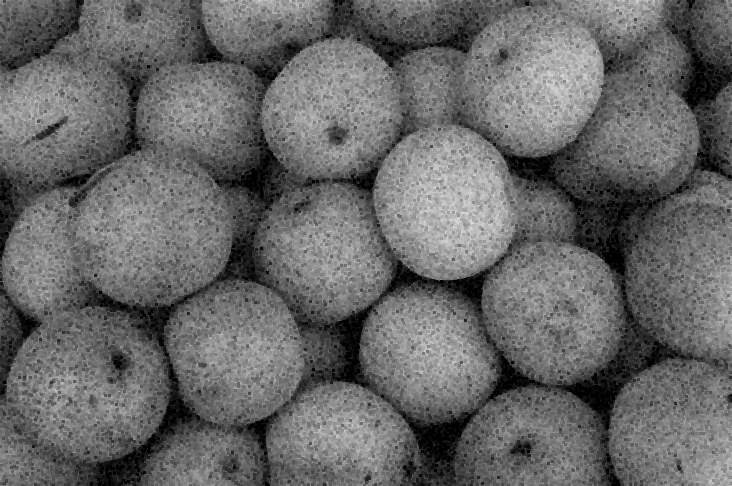



 Poisson Noise filtered



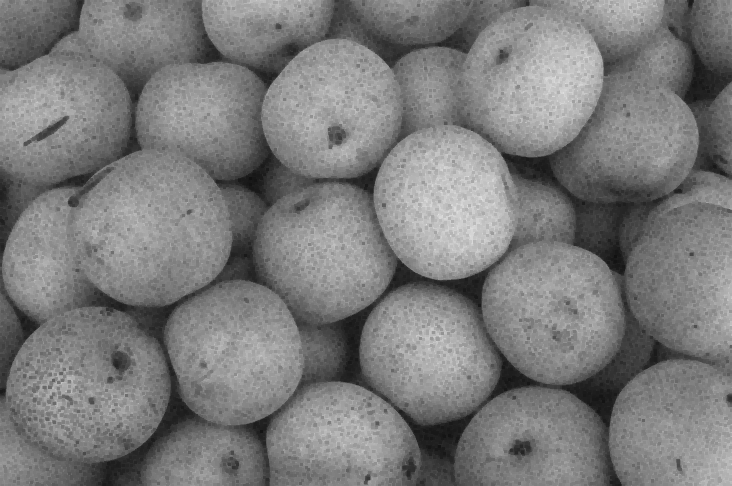



 Speckle Noise filtered



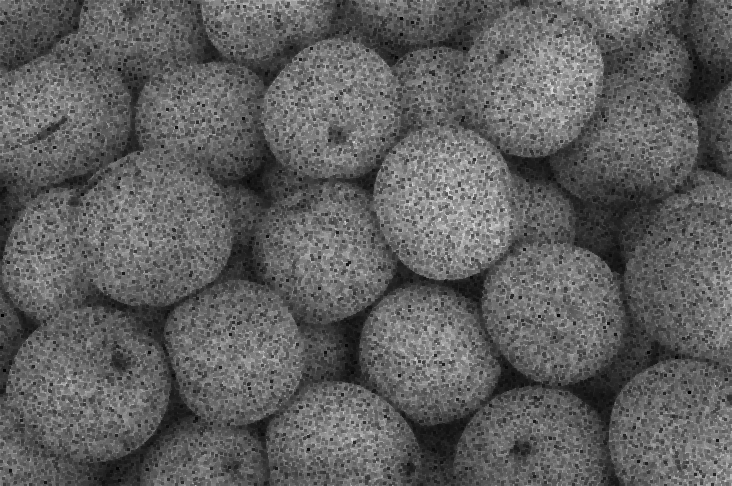



 Salt Noise filtered



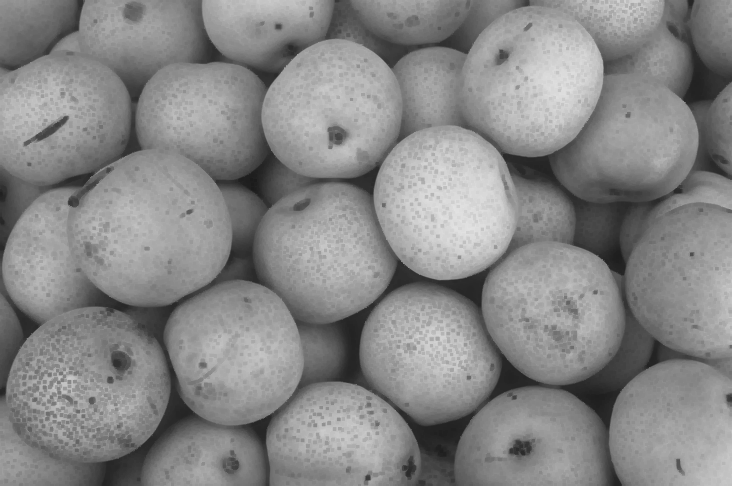



 Pepper Noise filtered



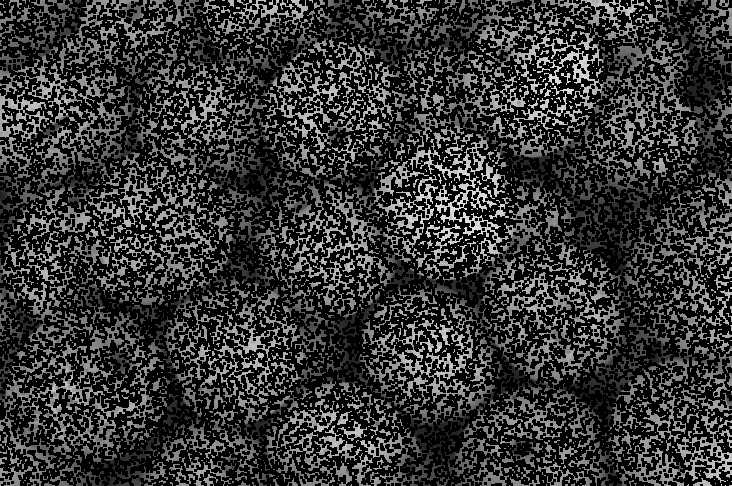



 Salt and Pepper Noise filtered



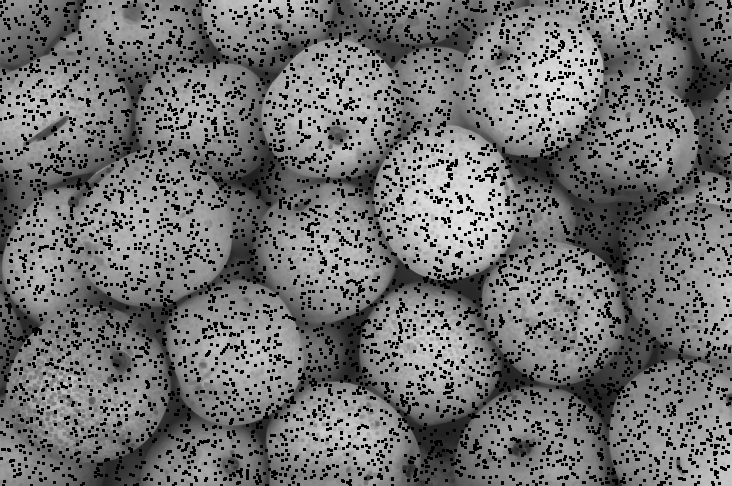

In [0]:
#applying the filter to the noise images
print("Minimum filter to remove noise")

for i in range(len(noise)):
    minimumFiltered = ndimage.filters.minimum_filter(noiseImages[i], size =(3,3))
    print("\n\n",noise[i], "Noise filtered\n")
    cv2_imshow(minimumFiltered)

## Maximum filter

Maximum filter to remove noise


 Gaussian Noise filtered



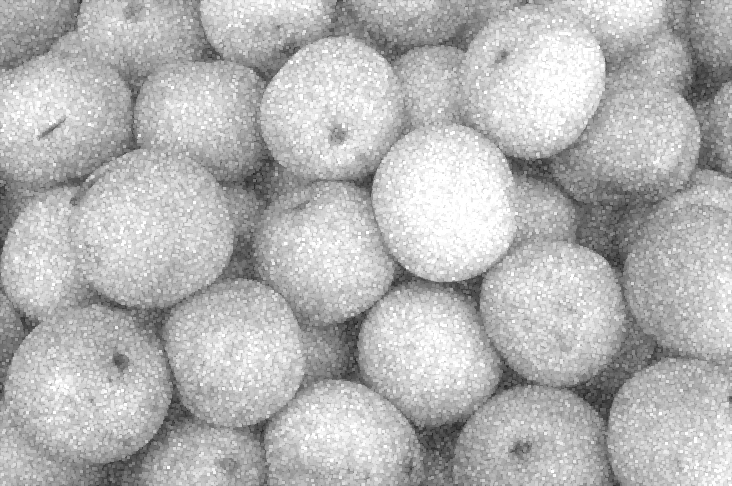



 Poisson Noise filtered



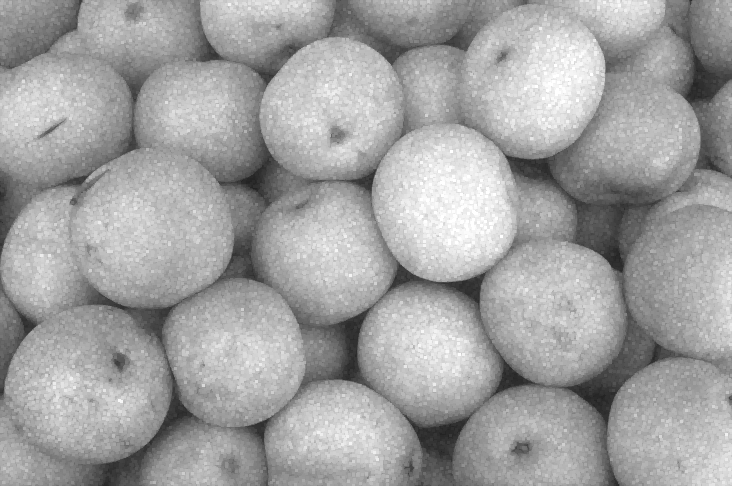



 Speckle Noise filtered



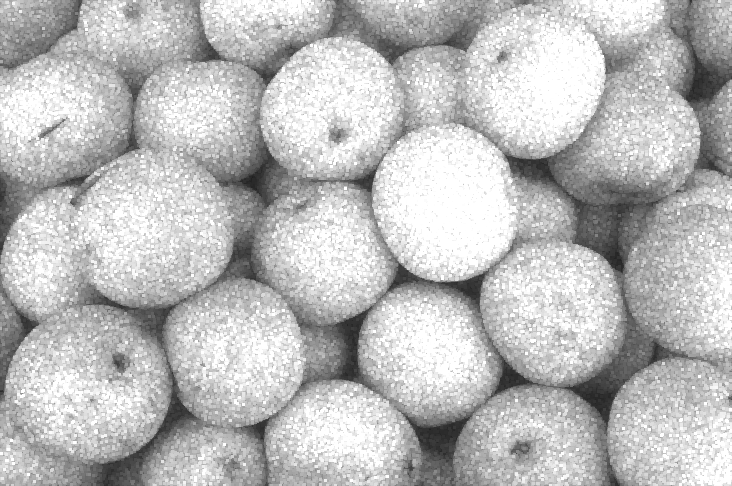



 Salt Noise filtered



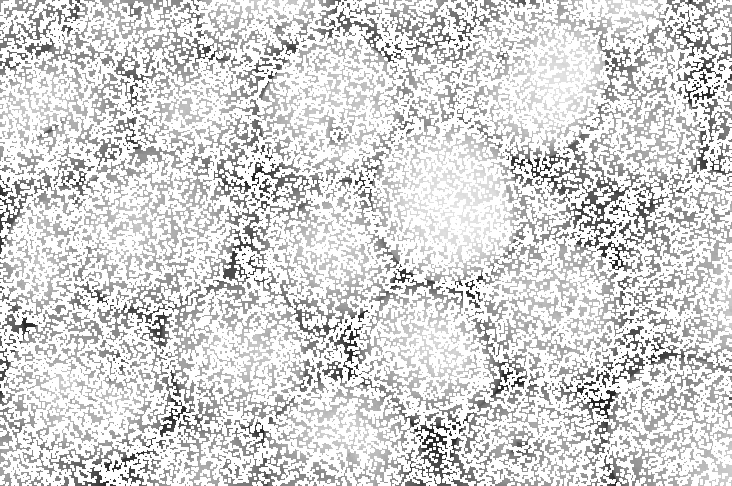



 Pepper Noise filtered



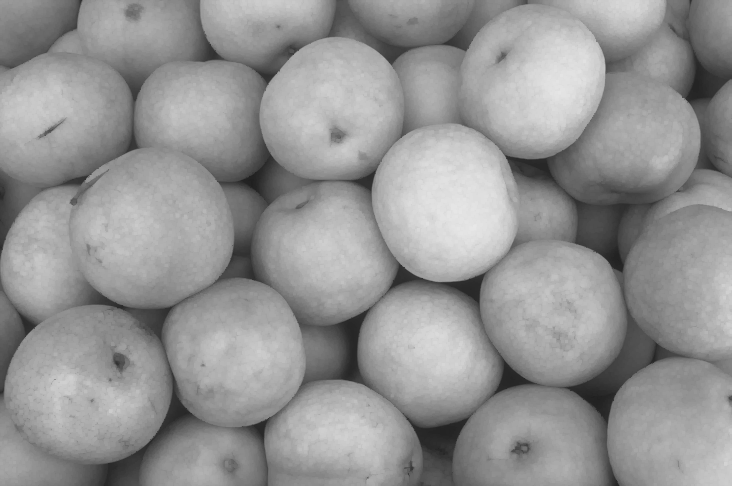



 Salt and Pepper Noise filtered



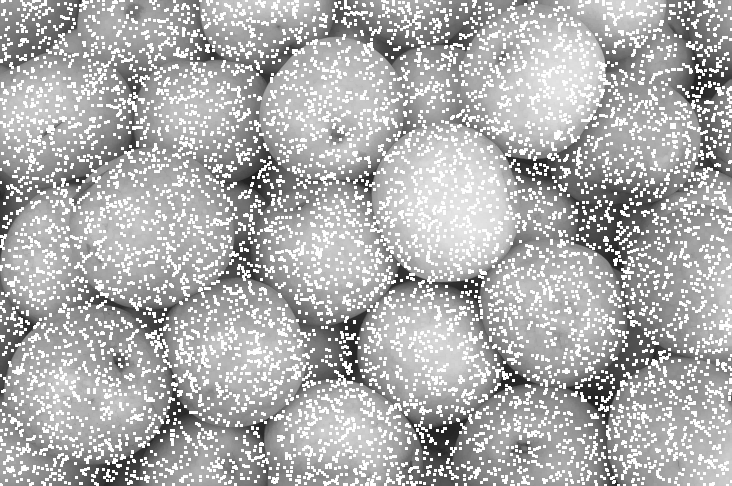

In [0]:
#applying the filter to the noise images
print("Maximum filter to remove noise")

for i in range(len(noise)):
    maximumFiltered = ndimage.filters.maximum_filter(noiseImages[i], size =(3,3))
    print("\n\n",noise[i], "Noise filtered\n")
    cv2_imshow(maximumFiltered)

## Median Filter

Median filter to remove noise


 Gaussian Noise filtered



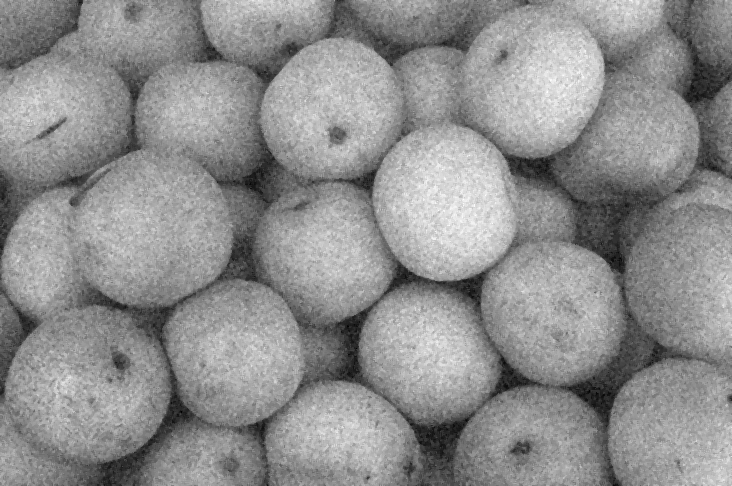



 Poisson Noise filtered



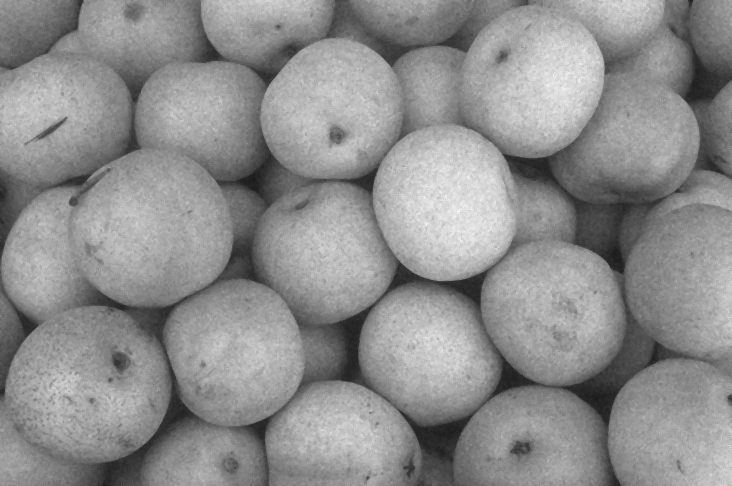



 Speckle Noise filtered



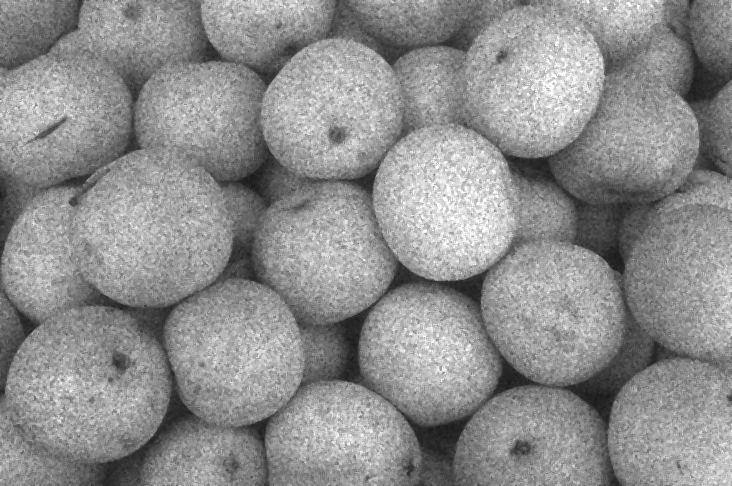



 Salt Noise filtered



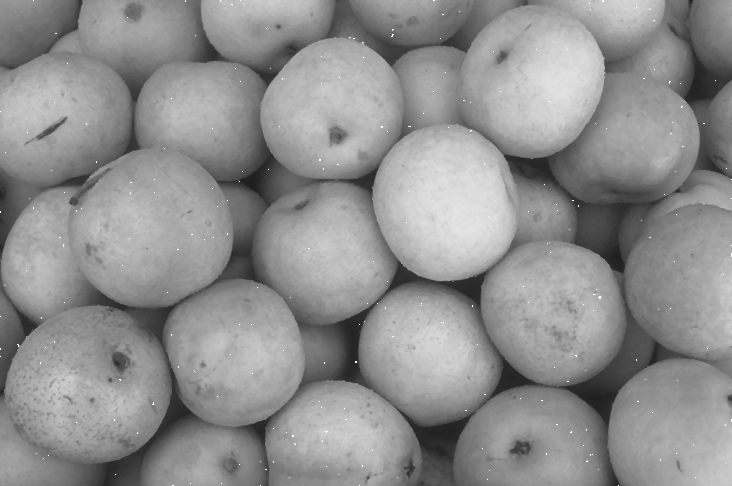



 Pepper Noise filtered



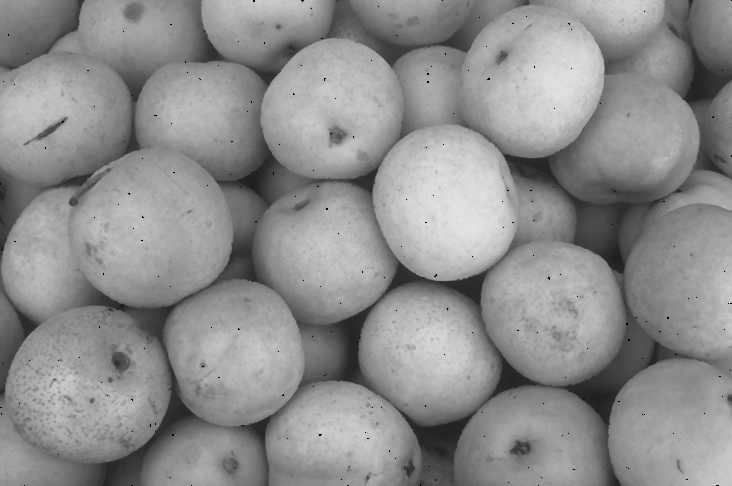



 Salt and Pepper Noise filtered



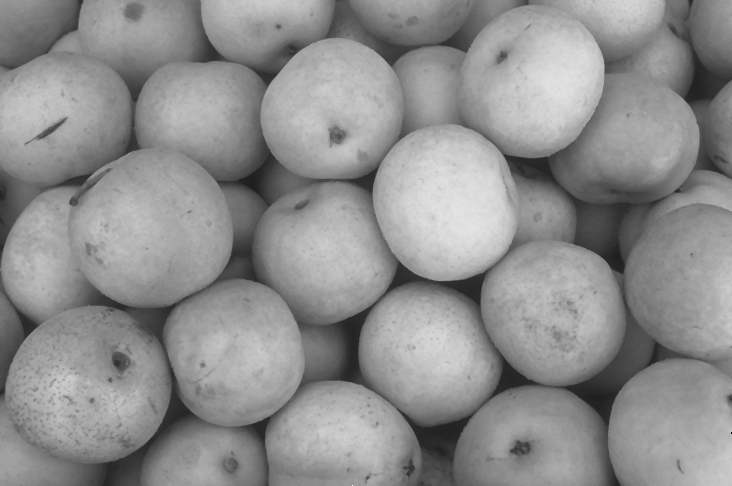

In [0]:
#applying the filter to the noise images
print("Median filter to remove noise")

for i in range(len(noise)):
    medianFiltered = ndimage.filters.median_filter(noiseImages[i], size =(3,3))
    print("\n\n",noise[i], "Noise filtered\n")
    cv2_imshow(medianFiltered)

## Geometric Mean Filter

Gaussian filter to remove noise


 Gaussian Noise filtered



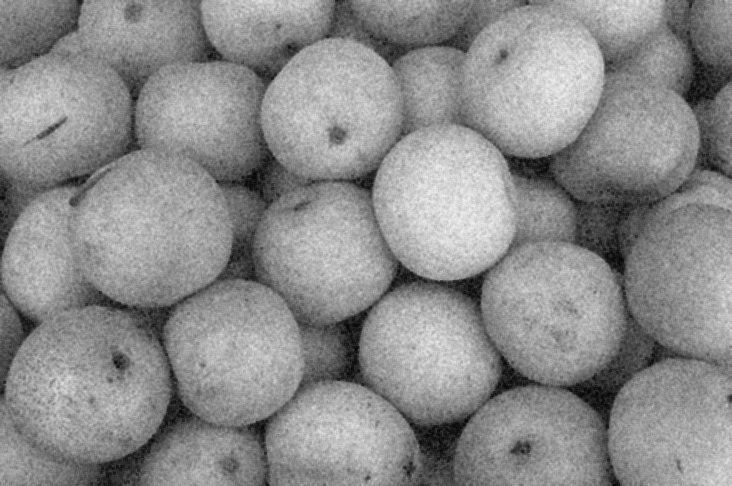



 Poisson Noise filtered



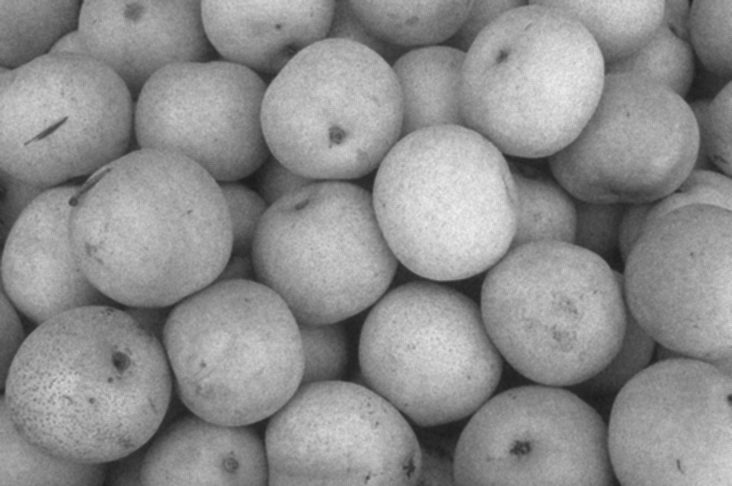



 Speckle Noise filtered



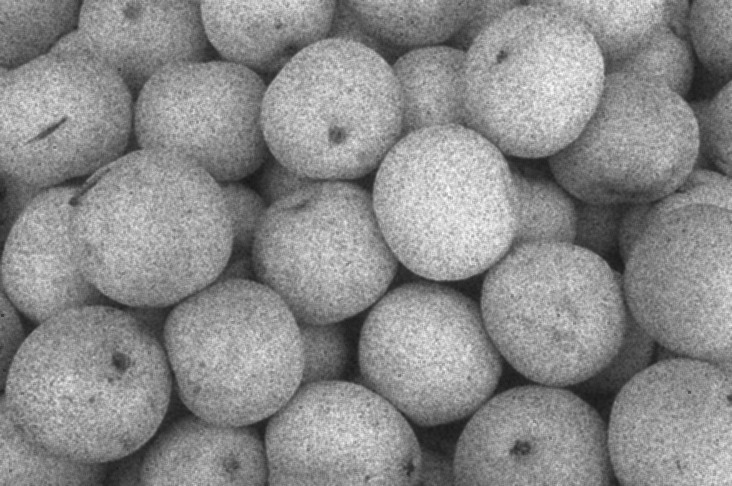



 Salt Noise filtered



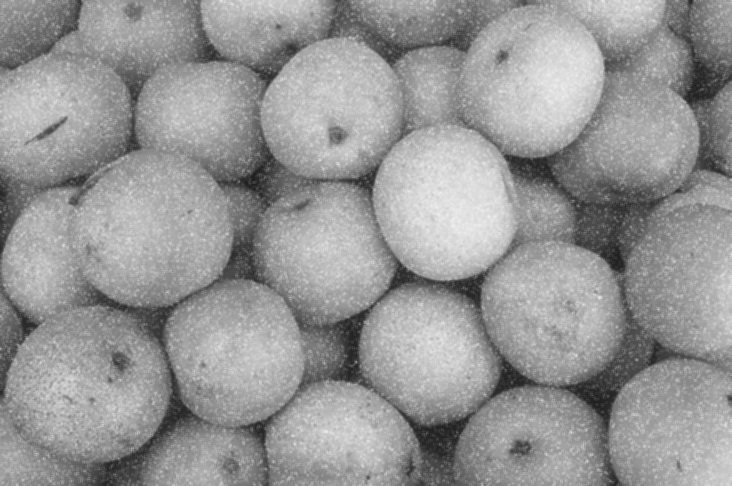



 Pepper Noise filtered



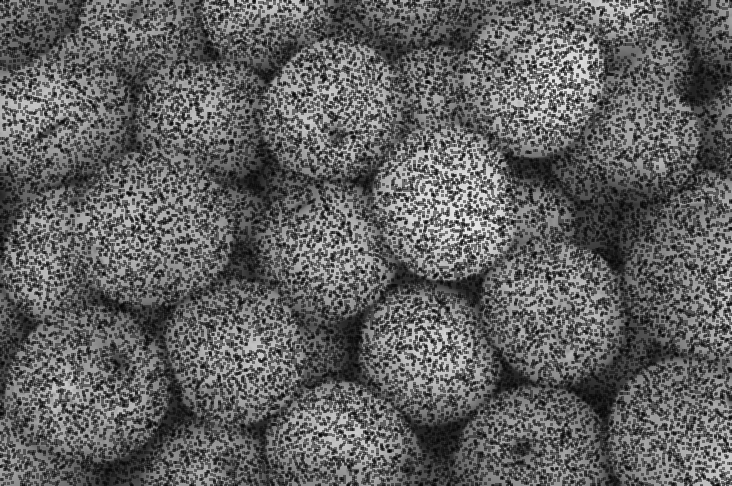



 Salt and Pepper Noise filtered



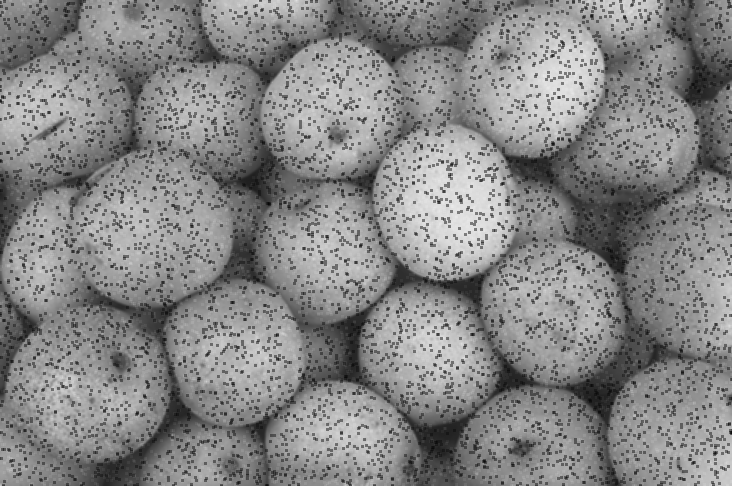

In [0]:
#applying the filter to the noise images
print("Gaussian filter to remove noise")

kernel = np.ones([3,3])

for i in range(len(noise)):
    geometricFiltered = filters.rank.geometric_mean(noiseImages[i], kernel)
    print("\n\n",noise[i], "Noise filtered\n")
    cv2_imshow(geometricFiltered)

## Harmonic mean

Harmonic mean filter to remove noise


 Gaussian Noise filtered



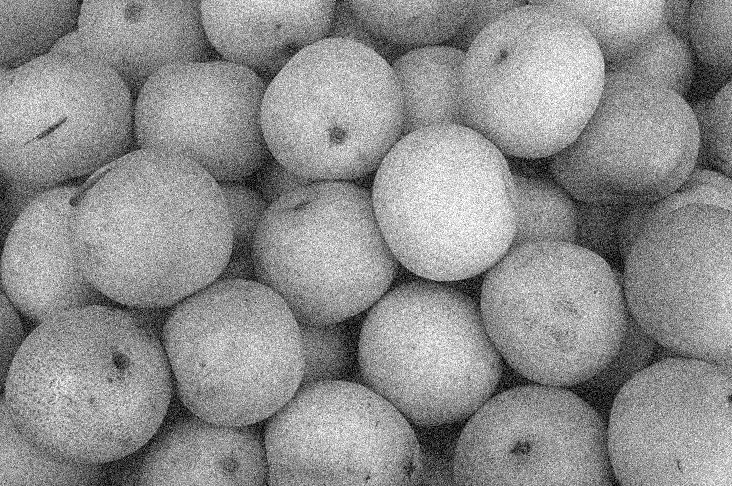



 Poisson Noise filtered



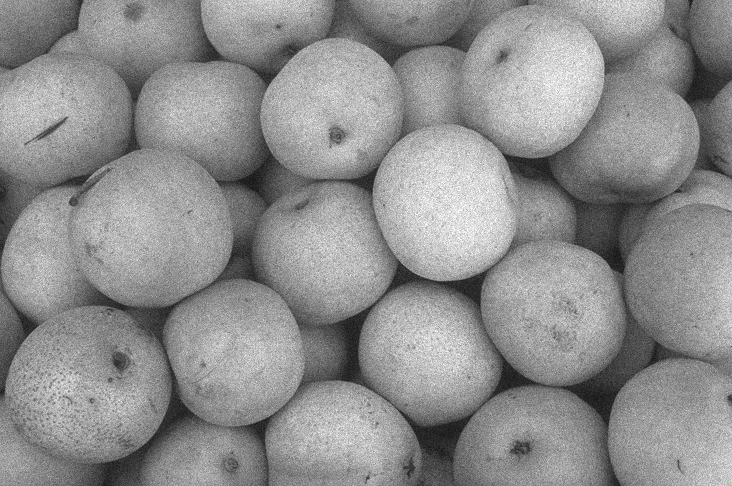



 Speckle Noise filtered



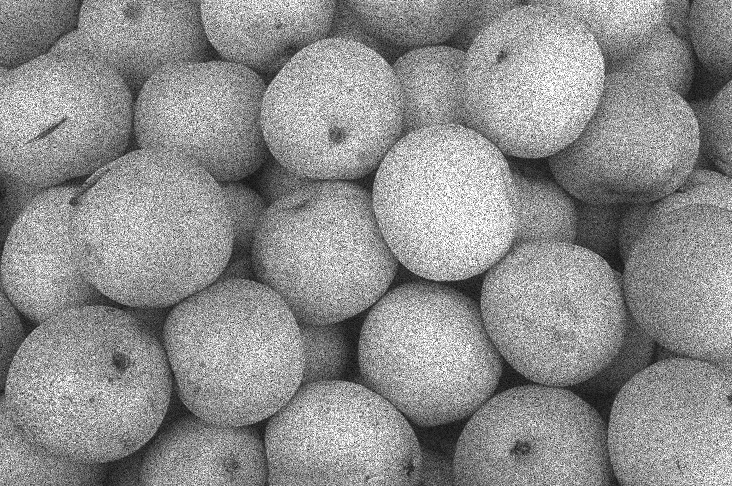



 Salt Noise filtered



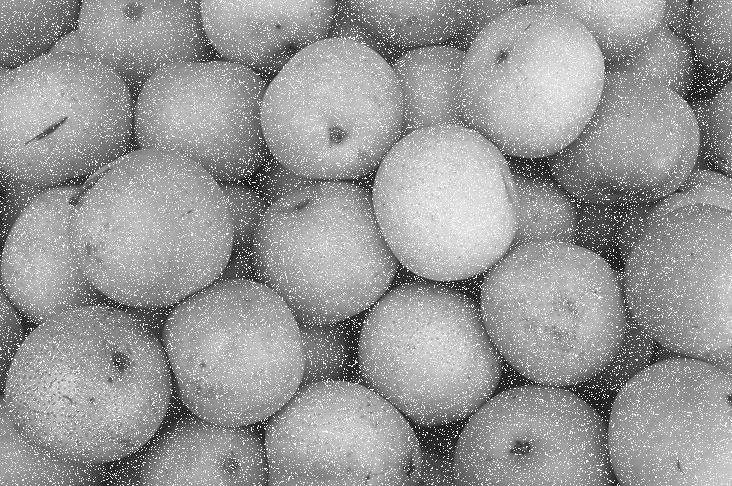



 Pepper Noise filtered



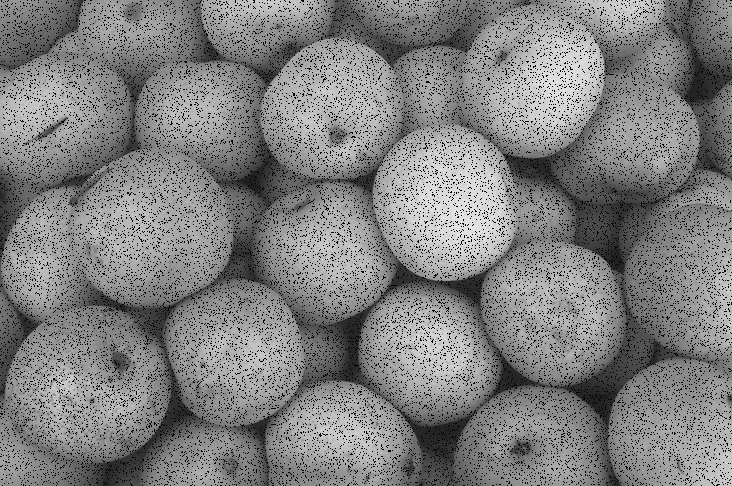



 Salt and Pepper Noise filtered



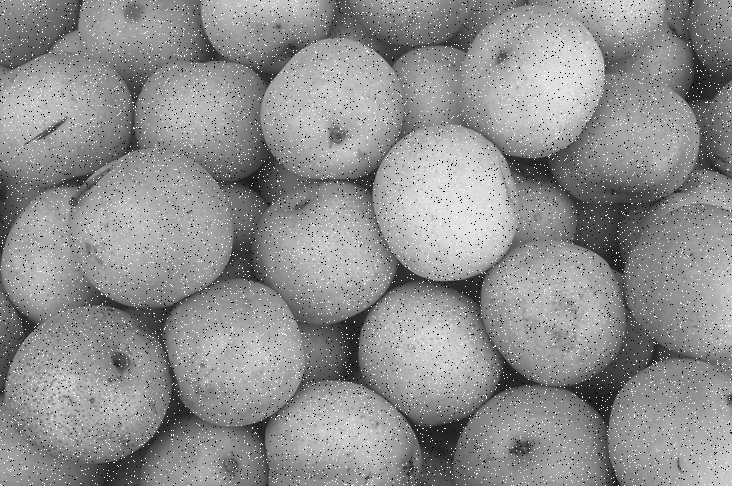

In [0]:
#applying the filter to the noise images
print("Harmonic mean filter to remove noise")


for i in range(len(noise)):
    j = k = 0
    #image resolution
    res_y, res_x = noiseImages[i].shape
    harmonicFiltered = np.copy(noiseImages[i])

    #Taking the reciprocal of the values of the original image
    temp = np.copy(noiseImages[i])
    for j in range(res_y):
        for k in range(res_x):
            if noiseImages[i][j][k] != 0:
                temp[j][k] = np.uint8(np.reciprocal(float(noiseImages[i][j][k])) * 255.0)
                
    j = k = 0
    #taking the harmonic mean of the box of values from the reciprocal Image
    #assigning it to the new image (manual filtering)
    box = np.zeros((3,3), dtype = np.uint8)
    while j != res_y and k != res_x:
        #filling the box
        for l in range(2):
            for m in range(2):
                try:
                    box[l][m] = temp[i][j + l][j + m]
                except:
                    pass
        
        #calculating and assinging the box harmonic mean to the new image
        boxMean = np.mean(box, dtype = "uint8")
        if boxMean != 0:
            harmonicFiltered[j][k] = np.uint8(np.reciprocal(float(boxMean) * 255.0))

        #traversing ahead in the original image
        j = j + 1
        k = k + 1       

    print("\n\n",noise[i], "Noise filtered\n")
    cv2_imshow(harmonicFiltered)

## Contra-Harmonic mean